Append dos diretórios necessários no path, para uso de alguns scripts externos ao notebook:

In [2]:
import os
import sys
path_list =  ['..', '../src', '../src/surface_stations' , '../data', '../src/sumare_radar'] 
for path  in path_list:
    module_path = os.path.abspath(path)
    if module_path not in sys.path:
        sys.path.append(module_path)
print(sys.path)

['/opt/homebrew/Cellar/python@3.11/3.11.13/Frameworks/Python.framework/Versions/3.11/lib/python311.zip', '/opt/homebrew/Cellar/python@3.11/3.11.13/Frameworks/Python.framework/Versions/3.11/lib/python3.11', '/opt/homebrew/Cellar/python@3.11/3.11.13/Frameworks/Python.framework/Versions/3.11/lib/python3.11/lib-dynload', '', '/Users/viniciusgoncalves/Library/Python/3.11/lib/python/site-packages', '/opt/homebrew/lib/python3.11/site-packages', '/Users/viniciusgoncalves/CEFET/repositories/atmoseer', '/Users/viniciusgoncalves/CEFET/repositories/atmoseer/src', '/Users/viniciusgoncalves/CEFET/repositories/atmoseer/src/surface_stations', '/Users/viniciusgoncalves/CEFET/repositories/atmoseer/data', '/Users/viniciusgoncalves/CEFET/repositories/atmoseer/src/sumare_radar']


Imports de Bibliotecas utilitárias e scripts:

In [20]:
import folium
import leafmap.foliumap as leafmap
import requests
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import PIL.Image as Image

import VAR #Credenciais Cemaden
from retrieve_data_cemaden import get_token #Obter token autenticação API Cemaden

import numpy as np
import math
from scipy import stats


Folium: Utilitário para construção de mapas:
https://python-visualization.github.io/folium/latest/

In [4]:
mapa = leafmap.Map(center= [-22.925778948753702, -43.489029909370046], zoom_start=8, tiles='cartodbpositron')
colormap = ['magenta', 'red', 'orange', 'yellow']
folium.LatLngPopup().add_to(mapa)

### Posicionamento dos sistemas de dados e do radar <h3>

RADAR SUMARÉ

In [5]:
lat = [-22.955139]
lon = [-43.248278]

for loc in zip(lat, lon):
    folium.Circle(
        location=loc,
        radius=100,
        fill=True,
        color='black',
        fill_opacity=0.7
    ).add_to(mapa)

for loc in zip(lat, lon):
    folium.Circle(
        location=loc,
        radius=137100,
        fill=True,
        color='gray',
        fill_opacity=0.1
    ).add_to(mapa)


CEMADEN

In [6]:
url_cemaden = "https://sws.cemaden.gov.br/PED/rest/pcds-cadastro/dados-cadastrais"

token = get_token(VAR.nome_secreto, VAR.senha_secreta)
codibge = "3304557" #Rio de janeiro

headers = {
    "token": token
}

params = {
    "codibge": codibge,
    "formato": "json"  
}

response = requests.get(url_cemaden, headers=headers, params=params)
posicoes = {}
if response.status_code == 200:
    estacoes = response.json()
    print("Número de estações encontradas:", len(estacoes))
    for estacao in estacoes:  
        codigo = estacao.get("codestacao")
        lat = estacao.get("latitude")
        lon = estacao.get("longitude")
        if codigo and lat and lon:
            posicoes[codigo] = (lat, lon)

    print("Dicionário de posições das estações:")
    for cod, coords in list(posicoes.items()): 
        print(f"{cod}: {coords}")
else:
    print("Erro ao buscar estações:", response.status_code)

print(estacoes)
for codestacao, (lat, lon) in posicoes.items():
    folium.Circle(
        location=[lat,lon],
        # popup=f"Estação: {codestacao}",
        fill=True,
        color='purple',
        fill_opacity=0.7
    ).add_to(mapa)

Número de estações encontradas: 28
Dicionário de posições das estações:
330455734A: (-22.7613, -43.1084)
330455733A: (-22.875, -43.299)
330455732A: (-22.869, -43.265)
330455731A: (-22.948, -43.258)
330455730A: (-22.943, -43.241)
330455729A: (-22.9666, -43.2965)
330455728A: (-22.86086, -43.30756)
330455726A: (-22.894, -43.676)
330455725A: (-22.8131, -43.3101)
330455724A: (-22.8076, -43.3584)
330455722A: (-22.923, -43.176)
330455721A: (-22.995, -43.269)
330455720A: (-22.796, -43.203)
330455719A: (-22.9922, -43.367)
330455718A: (-22.989, -43.433)
330455716A: (-22.921, -43.227)
330455715A: (-22.93, -43.25)
330455714A: (-22.929, -43.228)
330455713A: (-22.8689, -43.4507)
330455712A: (-22.864, -43.425)
330455711A: (-22.8897, -43.7175)
330455710A: (-22.9592, -43.6082)
330455709A: (-22.977861, -43.277444)
330455706A: (-22.839, -43.279)
330455705A: (-22.918, -43.361)
330455704A: (-22.896, -43.352)
330455703A: (-22.885906, -43.297753)
330455701A: (-22.915, -43.176)
[{'altitude': 0.0, 'cidade': 'R

ALERTA RIO

In [ ]:
import pandas as pd

df_estacoes = pd.read_csv('../../config/GaugeStations.csv')

df_estacoes_pluviometricas = df_estacoes[~df_estacoes.index.isin([2,3,4,5,6,7,8,9,10,12,13,14,15,17,18,20,21,23,24,25,27,29,30,31,33])]
df_estacoes_meteorologicas = df_estacoes[df_estacoes.index.isin([1,11,16,19,20,22,28,32])]
df_estacoes.head()

lat = list(df_estacoes_pluviometricas.VL_LATITUDE)
lon = list(df_estacoes_pluviometricas.VL_LONGITUDE)

for loc in zip(lat, lon):
    folium.Circle(
        location=loc,
        radius=10,
        fill=True,
        color='red',
        fill_opacity=0.7
    ).add_to(mapa)

lat = list(df_estacoes_meteorologicas.VL_LATITUDE)
lon = list(df_estacoes_meteorologicas.VL_LONGITUDE)

for loc in zip(lat, lon):
    folium.Circle(
        location=loc,
        radius=10,
        fill=True,
        color='black',
        fill_opacity=0.7
    ).add_to(mapa)

INMET

In [8]:
import pandas as pd

#Novo data set
dfnew = pd.read_json('https://apitempo.inmet.gov.br/estacoes/T')
dfnewrj = dfnew[dfnew['SG_ESTADO'] == 'RJ']

dfnewrj.head()

lat = list(dfnewrj.VL_LATITUDE)
lon = list(dfnewrj.VL_LONGITUDE)

for loc in zip(lat, lon):
    folium.Circle(
        location=loc,
        radius=10,
        fill=True,
        color='blue',
        fill_opacity=0.7
    ).add_to(mapa)


SIRENES

In [9]:
sirenes = pd.read_parquet('../data/websirenes_defesa_civil/websirenes_stations.parquet')
sirenes.head()

lat = list(sirenes.latitude)
lon = list(sirenes.longitude)

for loc in zip(lat, lon):
    folium.Circle(
        location=loc,
        radius=10,
        fill=True,
        color='green',
        fill_opacity=0.7
    ).add_to(mapa)

In [10]:
# Define the legend
legend_dict = {
    "Sirenes": "green",
    "INMET": "blue",
    "COR_Pluviométricas": "red",
    "COR_Meteorológicas": "black",
    "CEMADEN": "purple",
    "Radar_Sumaré": "grey"
}

mapa.add_legend(title="Legend Title", legend_dict=legend_dict)
mapa.to_html("mapa.html")

In [11]:
mapa

Resoluções temporais dos sistemas utilizados:
- CEMADEN : 1h
- INMET: 1h
- SUMARÉ: 2min
- COR: 15min
- SIRENES: 15min

In [12]:
cemaden_temp_resolution = "1H"
inmet_temp_resolution = "1h"
sumare_temp_resolution = "2min"
cor_temp_resolution = "15min"
sirenes_temp_resolution = "15min"

Processamento dos dados do radar sumaré - Correspondência pixel/latitude-longitude:

In [13]:
def rgb_distance(c1, c2):
    return math.sqrt((c1[0] - c2[0])**2 + (c1[1] - c2[1])**2 + (c1[2] - c2[2])**2)

def interpolate_value(rgb, legend_colors, legend_values):
    if rgb == (0,0,0):
        return 0
    # Calcular distâncias entre a cor fornecida e todas as cores da legenda
    distances = [rgb_distance(rgb, lc) for lc in legend_colors]

    # Identificar as duas cores mais próximas na legenda
    min_idx1 = distances.index(min(distances))  # Índice da cor mais próxima
    distances[min_idx1] = float('inf')  # Excluir a cor mais próxima para achar a segunda
    min_idx2 = distances.index(min(distances))  # Índice da segunda cor mais próxima

    # Obter as cores e valores correspondentes
    c1, c2 = legend_colors[min_idx1], legend_colors[min_idx2]
    v1, v2 = legend_values[min_idx1], legend_values[min_idx2]

    # Calcular o peso de interpolação (t)
    dist_c1_c2 = rgb_distance(c1, c2)
    dist_c1_rgb = rgb_distance(c1, rgb)
    t = dist_c1_rgb / dist_c1_c2 if dist_c1_c2 != 0 else 0

    # Interpolar o valor
    interpolated_value = v1 + t * (v2 - v1)
    return interpolated_value

def get_radar_data(inicio, fim, frequencia, latitude, longitude):
    latitude = float(latitude)
    longitude = float(longitude)

    pos_sumare = (-22.955139,-43.248278)
    legend_values = [50, 45, 40, 35, 30, 25, 20,0]
    legend_colors = [
    (197,0,197),  # Magenta
    (227,6,5),    # Vermelho
    (255,112,0),  # Laranja
    (195,230,0),  # Amarelo
    (4,85,4),  # Amarelo
    (19,122,19),    # Verde escuro
    (0,167,12),     # Verde claro
    (0,0,0)         #Vazio
    ]

    # Definir datas inicial e final
    data_inicial = inicio + " 00:00:00"
    data_final   = fim +  " 23:58:00"

    datas = pd.date_range(start=data_inicial, end=data_final, freq=frequencia)

    # Criar DataFrame com coluna "datahora"
    radar_data = pd.DataFrame({"datahora": datas})
    radar_data['reflect'] = np.nan

    count = 0
    while count < len(radar_data):

        datetime_str  = radar_data.iloc[count]['datahora'].strftime("%Y-%m-%d %H:%M:%S")
      
        year = datetime_str[0:4]
        month = datetime_str[5:7]
        day = datetime_str[8:10]
        hour = datetime_str[11:13]
        minute = datetime_str[14:16]
        file = year + '_'+ month + '_'+ day  + '_' +  hour + '_' + minute + '.png'
        file_path = '../data/radar_sumare/' + year + "/" + month + "/" + day + "/" + file

        if os.path.exists(file_path):
            try:
                img = Image.open(file_path)
                pos_sumare_img = (img.height/2, img.width/2)

                dify = (pos_sumare_img[0]/pos_sumare[0])
                difx = (pos_sumare_img[1]/pos_sumare[1])

                posx = pos_sumare[1] - ((longitude - pos_sumare[1]) * 32.5)
                valorx = posx * difx
                posy = pos_sumare[0] + ((latitude - pos_sumare[0]) * 19.5)
                valory = posy * dify
                
                rgb_im = img.convert('RGB')
                r, g, b = rgb_im.getpixel((valorx, valory))
                radar_data.at[count,'reflect'] = interpolate_value((r, g, b), legend_colors, legend_values)

                print(radar_data.iloc[count])
            except Exception as e:
                print("Mensagem de erro:", str(e))
   
        count += 1

    return radar_data

In [14]:
def dispersao(data,x,y,titulo):# Gráfico de dispersão com seaborn
    sns.scatterplot(x=x, y=y, data=data)
    plt.title(titulo)
    plt.savefig(titulo + ".png", dpi=300, bbox_inches="tight")   # PNG em alta resolução
    #plt.savefig("dispersao.pdf", bbox_inches="tight")            # PDF vetorial
    #plt.savefig("dispersao.svg", bbox_inches="tight")            # SVG vetorial

CEMADEN - RADAR_SUMARE: CORRELAÇÃO

In [ ]:
cemaden_info_stations = pd.DataFrame(estacoes)
print(cemaden_info_stations.shape)
cemaden_info_stations.head()

(28, 21)


,altitude,cidade,codestacao,codibge,cota_alerta,cota_atencao,cota_transbordamento,data_instalacao,dh_cadastro,dh_inicio_inativo,...,id_estacao,id_rede,id_tipoestacao,latitude,longitude,nome,offset,rede_sigla,tipoestacao_descricao,uf
0,0.0,RIO DE JANEIRO,330455734A,3304557,None,None,None,2015-04-17 13:23:58.932,2015-04-17 13:23:58.932,2024-03-26 20:45:51.749,...,7615,11,1,-22.761300,-43.108400,Ilha de Paquetá,None,CEMADEN,Pluviométrica,RJ
1,0.0,RIO DE JANEIRO,330455733A,3304557,None,None,None,2015-05-22 11:03:39.609,2015-05-22 11:03:39.609,2025-05-24 03:35:26.360,...,7614,11,1,-22.875000,-43.299000,Pilares,None,CEMADEN,Pluviométrica,RJ
2,0.0,RIO DE JANEIRO,330455732A,3304557,None,None,None,2015-05-26 13:12:55.735,2015-05-26 13:12:55.735,2025-06-26 06:26:19.726,...,7613,11,1,-22.869000,-43.265000,Higienópolis,None,CEMADEN,Pluviométrica,RJ
3,0.0,RIO DE JANEIRO,330455731A,3304557,None,None,None,2015-03-04 20:17:58.835,2015-03-04 20:17:58.835,2025-06-26 07:16:09.334,...,7612,11,1,-22.948000,-43.258000,Usina,None,CEMADEN,Pluviométrica,RJ
4,0.0,RIO DE JANEIRO,330455730A,3304557,None,None,None,2015-05-20 13:03:35.902,2015-05-20 13:03:35.902,2025-09-03 13:04:55.200,...,7611,11,1,-22.943000,-43.241000,Tijuca,None,CEMADEN,Pluviométrica,RJ
5,0.0,RIO DE JANEIRO,330455729A,3304557,None,None,None,2015-08-20 12:31:52.784,2015-08-20 12:31:52.784,2025-08-05 15:14:16.114,...,7610,11,1,-22.966600,-43.296500,Alto da Boa Vista,None,CEMADEN,Pluviométrica,RJ
6,0.0,RIO DE JANEIRO,330455728A,3304557,None,None,None,2015-05-15 12:53:15.827,2015-05-15 12:53:15.827,2025-05-28 22:07:38.597,...,7609,11,1,-22.860860,-43.307560,Vicente de Carvalho,None,CEMADEN,Pluviométrica,RJ
7,0.0,RIO DE JANEIRO,330455726A,3304557,None,None,None,2015-02-20 14:31:36.673,2015-02-20 14:31:36.673,2023-06-27 18:52:25.122,...,7607,11,1,-22.894000,-43.676000,Defesa Civil Santa Cruz,None,CEMADEN,Pluviométrica,RJ
8,0.0,RIO DE JANEIRO,330455725A,3304557,None,None,None,2015-05-04 13:35:59.398,2015-05-04 13:35:59.398,2025-06-26 06:44:45.865,...,7606,11,1,-22.813100,-43.310100,Vigário Geral,None,CEMADEN,Pluviométrica,RJ
9,0.0,RIO DE JANEIRO,330455724A,3304557,None,None,None,2015-05-04 14:11:06.152,2015-05-04 14:11:06.152,2025-09-05 11:38:23.659,...,7605,11,1,-22.807600,-43.358400,Pavuna,None,CEMADEN,Pluviométrica,RJ


In [16]:
cemaden_directory = "../data/ws/cemaden/raw/"
cemaden_data_station = pd.read_parquet(cemaden_directory +  "330455734A.parquet") #Ilha de Paquetá
cemaden_data_station.head()


sensor,datahora,chuva,intensidade_precipitacao,precipitacao_nao_registrada
0,2015-06-25 18:40:00,0.2,1.0,NaN
1,2015-06-25 18:50:00,0.0,0.0,NaN
2,2015-06-25 19:00:00,0.0,0.0,NaN
3,2015-06-25 20:00:00,0.0,0.0,NaN
4,2015-06-25 21:00:00,0.0,0.0,NaN


sensor
datahora                        object
chuva                          float64
intensidade_precipitacao       float64
precipitacao_nao_registrada    float64
dtype: object
[ 0.2  0.   0.4  0.8  1.2  0.6  2.6  1.6  1.   3.   1.4  4.   2.4  3.6
  3.4  6.2  5.   3.2  2.2  4.4  2.   4.8  6.4 15.   9.8  7.4  4.6  6.8
  8.8  1.8  6.   5.2  5.4  7.8  5.8  2.8 17.8 26.8 17.6  9.6  6.6  9.
 10.6  8.2 14.6  5.6  0.6  1.2  2.4  7.   5.6  3.8 11.4 10.4  2.8  8.4
  8.   6.8  5.8  7.6  6.6  4.2 12.   nan 13.6 10.   4.8  4.6  7.8  3.4
  8.6 12.8 15.2 13.8 15.8 17.4  7.2  8.2 12.4 18.4 11.2 21.2 23.  14.8
 14.4 11.  11.8  9.4 19.6 13.  20.  16.8 17.2 16.2 13.2 18.  15.4 11.6
 18.2 30.  14.  17.  78.8]


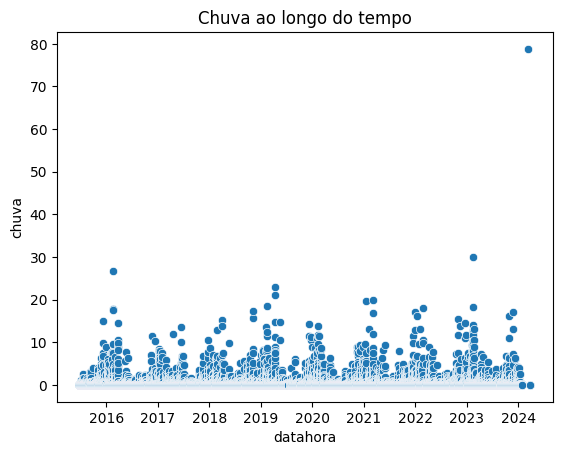

In [17]:
print(cemaden_data_station.dtypes)
print(cemaden_data_station["chuva"].unique())
cemaden_data_station["datahora"] = pd.to_datetime(cemaden_data_station["datahora"], errors="coerce", dayfirst=True)

# Gráfico de dispersão com seaborn
sns.scatterplot(x="datahora", y="chuva", data=cemaden_data_station)
plt.title("Chuva ao longo do tempo")

# Salvar em diferentes formatos
plt.savefig("dispersao.png", dpi=300, bbox_inches="tight")   # PNG em alta resolução
#plt.savefig("dispersao.pdf", bbox_inches="tight")            # PDF vetorial
#plt.savefig("dispersao.svg", bbox_inches="tight")            # SVG vetorial

plt.show()

In [18]:
idx = cemaden_info_stations.index[cemaden_info_stations["codestacao"] == "330455734A"][0]
latitude = cemaden_info_stations.iloc[idx]["latitude"]
longitude = cemaden_info_stations.iloc[idx]["longitude"]
nome = cemaden_info_stations.iloc[idx]['nome']
print(nome,latitude, longitude)


radar_data = get_radar_data("2011-01-01","2025-01-01", cemaden_temp_resolution,latitude, longitude)
radar_data["datahora"] = pd.to_datetime(radar_data["datahora"], errors="coerce", dayfirst=True)
print(radar_data['reflect'].unique())
radar_data.head()



Ilha de Paquetá -22.7613 -43.1084
datahora    2011-01-17 18:00:00
reflect                     0.0
Name: 402, dtype: object
datahora    2011-01-17 19:00:00
reflect                     0.0
Name: 403, dtype: object
datahora    2011-01-17 21:00:00
reflect                     0.0
Name: 405, dtype: object
datahora    2011-01-17 22:00:00
reflect                     0.0
Name: 406, dtype: object
datahora    2011-01-17 23:00:00
reflect                     0.0
Name: 407, dtype: object
datahora    2011-01-18 00:00:00
reflect                     0.0
Name: 408, dtype: object
datahora    2011-01-18 01:00:00
reflect                     0.0
Name: 409, dtype: object
datahora    2011-01-18 02:00:00
reflect                     0.0
Name: 410, dtype: object
datahora    2011-01-18 03:00:00
reflect                     0.0
Name: 411, dtype: object
datahora    2011-01-18 04:00:00
reflect                     0.0
Name: 412, dtype: object
datahora    2011-01-18 05:00:00
reflect                     0.0
Name: 413, d

,datahora,reflect
0,2011-01-01 00:00:00,NaN
1,2011-01-01 01:00:00,NaN
2,2011-01-01 02:00:00,NaN
3,2011-01-01 03:00:00,NaN
4,2011-01-01 04:00:00,NaN


reflect
0.000000     0.755596
NaN          0.231224
20.000000    0.003992
25.000000    0.002012
30.000000    0.001629
               ...   
21.519889    0.000008
28.753785    0.000008
40.995006    0.000008
22.541241    0.000008
28.607923    0.000008
Name: proportion, Length: 169, dtype: float64


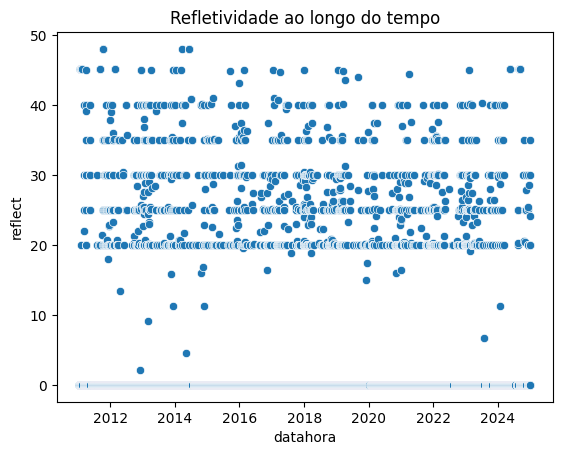

In [30]:
print(radar_data["reflect"].value_counts(normalize=True, dropna=False))
dispersao(radar_data,"datahora", "reflect","Refletividade ao longo do tempo")

In [28]:
df_correlacao = pd.merge(cemaden_data_station, radar_data, on="datahora", how="inner")
print(df_correlacao.shape)
df_correlacao= df_correlacao.dropna(subset=["datahora", "reflect", "intensidade_precipitacao"])
print(df_correlacao.shape)

print(stats.spearmanr(df_correlacao['chuva'],df_correlacao['reflect']))
print(stats.pearsonr(df_correlacao['chuva'],df_correlacao['reflect']))


(19211, 5)
(16638, 5)
SignificanceResult(statistic=np.float64(0.1773521298898834), pvalue=np.float64(1.232695339293626e-117))
PearsonRResult(statistic=np.float64(0.09777106389384145), pvalue=np.float64(1.259658726165164e-36))
